<a href="https://colab.research.google.com/github/Vihanga12/DSPL/blob/main/Trainnnnfinal.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Data Preprocessing

In [ ]:
#Importing the libraries
import pandas as pd
import numpy as np
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, MinMaxScaler, LabelEncoder, OneHotEncoder
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
import seaborn as sns
import matplotlib.pyplot as plt
import os
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.manifold import TSNE
import umap

In [ ]:
#Mount google drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#File path
df = pd.read_csv("/content/drive/MyDrive/DSPL/traincsv.csv")  # This line reads the CSV file into a DataFrame named 'df'

<ipython-input-67-8b043e158f4e>:1: DtypeWarning:

Columns (3,4,5) have mixed types. Specify dtype option on import or set low_memory=False.



In [ ]:
# Data Understanding
print("Initial Data Info:")
print(df.info())

Initial Data Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 774155 entries, 0 to 774154
Data columns (total 6 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Customer_ID       774153 non-null  float64
 1   outlet_city       774153 non-null  object 
 2   luxury_sales      774120 non-null  object 
 3   fresh_sales       774114 non-null  object 
 4   dry_sales         774125 non-null  object 
 5   cluster_catgeory  774154 non-null  object 
dtypes: float64(1), object(5)
memory usage: 35.4+ MB
None


In [ ]:
#Describe
df.describe(include='all')

,Customer_ID,outlet_city,luxury_sales,fresh_sales,dry_sales,cluster_catgeory
count,7.741530e+05,774153,774120,774114,774125.00,774154.0
unique,NaN,20,143897,257030,270131.00,18.0
top,NaN,Colombo,1029.6,6013.92,9168.72,1.0
freq,NaN,41031,62,28,23.00,188975.0
mean,1.038708e+07,NaN,NaN,NaN,NaN,NaN
std,2.234795e+05,NaN,NaN,NaN,NaN,NaN
min,1.000000e+07,NaN,NaN,NaN,NaN,NaN
25%,1.019354e+07,NaN,NaN,NaN,NaN,NaN
50%,1.038708e+07,NaN,NaN,NaN,NaN,NaN
75%,1.058062e+07,NaN,NaN,NaN,NaN,NaN


In [ ]:
#Shape of the dataset
df.shape

(774155, 6)

In [ ]:
#Check for duplicates
num_duplicates = df.duplicated().sum()
print(f"Number of duplicate rows: {num_duplicates}")

Number of duplicate rows: 0


In [ ]:
# Removing Duplicates
df.drop_duplicates(inplace=True)

In [ ]:
# Check for missing values
missing_values = df.isnull().sum()
print("Missing Values per Column:")
print(missing_values)

Missing Values per Column:
Customer_ID         0
outlet_city         0
luxury_sales        0
fresh_sales         0
dry_sales           0
cluster_catgeory    0
dtype: int64


In [ ]:
# Remove rows with any missing values
df.dropna(inplace=True)

In [ ]:
# Handle outliers using IQR
def remove_outliers(df, columns):
    for col in columns:
        if col in df.columns and pd.api.types.is_numeric_dtype(df[col]):
            Q1, Q3 = df[col].quantile(0.25), df[col].quantile(0.75)
            IQR = Q3 - Q1
            lower, upper = Q1 - 1.5 * IQR, Q3 + 1.5 * IQR
            df = df[(df[col] >= lower) & (df[col] <= upper)]
    return df

# Apply outlier removal to numeric columns
numeric_columns = ["luxury_sales", "fresh_sales", "dry_sales","cluster_category"]

Data Transformation

In [ ]:
# Convert relevant columns to float
columns_to_convert = ["luxury_sales", "fresh_sales", "dry_sales"]  # Adjust as needed
df[columns_to_convert] = df[columns_to_convert].apply(pd.to_numeric, errors='coerce')

In [ ]:
# Convert cluster_category to numeric, forcing errors to NaN
df["cluster_catgeory"] = pd.to_numeric(df["cluster_catgeory"], errors="coerce")
valid_clusters = {1, 2, 3, 4, 5, 6}
df["cluster_catgeory"] = df["cluster_catgeory"].apply(lambda x: x if x in valid_clusters else None)
df["cluster_catgeory"].fillna(df["cluster_catgeory"].mode()[0], inplace=True)

<ipython-input-77-0ae4a99691d6>:5: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [ ]:
# Normalization for train_df
scaler = MinMaxScaler()
sales_columns = ["luxury_sales", "fresh_sales", "dry_sales"]

# Replace 'train_cleaned' with 'df'
df[sales_columns] = scaler.fit_transform(df[sales_columns])
print(df)

        Customer_ID outlet_city  luxury_sales  fresh_sales  dry_sales  \
0        10493832.0    Kelaniya      0.109175     0.018966   0.354981   
1        10178643.0    Moratuwa      0.167720     0.041494   0.407956   
2        10513916.0     Wattala      0.275227     0.072681   0.641183   
3        10334589.0     Wattala      0.273082     0.091841   0.637052   
4        10458365.0    Kelaniya      0.283937     0.116281   0.647737   
...             ...         ...           ...          ...        ...   
774150   10197979.0     Gampaha      0.522090     0.251402   0.218414   
774151   10494575.0  Katunayake      0.860948     0.374724   0.427811   
774152   10565682.0     Colombo      0.711026     0.320062   0.308870   
774153   10351977.0       Kandy      0.894165     0.430568   0.403019   
774154   10637635.0     Negombo      0.820583     0.409541   0.452712   

        cluster_catgeory  
0                    4.0  
1                    1.0  
2                    4.0  
3              

In [ ]:
# Encode the "outlet_city" column directly
label_encoder = LabelEncoder()

df["outlet_city"] = label_encoder.fit_transform(df["outlet_city"])

In [ ]:
!pip install openpyxl
import openpyxl

df.to_excel('Trainpreprocessed_data.xlsx', index=False)

In [ ]:
#read the csv
df = pd.read_excel("/content/preprocessed_data.xlsx")
df

,Customer_ID,outlet_city,luxury_sales,fresh_sales,dry_sales,cluster_catgeory
0,10493832,11,0.109175,0.018966,0.354981,4
1,10178643,13,0.167720,0.041494,0.407956,1
2,10513916,19,0.275227,0.072681,0.641183,4
3,10334589,19,0.273082,0.091841,0.637052,4
4,10458365,11,0.283937,0.116281,0.647737,4
...,...,...,...,...,...,...
774056,10197979,4,0.522090,0.251402,0.218414,3
774057,10494575,10,0.860948,0.374724,0.427811,3
774058,10565682,1,0.711026,0.320062,0.308870,3
774059,10351977,9,0.894165,0.430568,0.403019,3


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 774061 entries, 0 to 774060
Data columns (total 6 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Customer_ID       774061 non-null  int64  
 1   outlet_city       774061 non-null  int64  
 2   luxury_sales      774051 non-null  float64
 3   fresh_sales       774052 non-null  float64
 4   dry_sales         774053 non-null  float64
 5   cluster_catgeory  774061 non-null  int64  
dtypes: float64(3), int64(3)
memory usage: 35.4 MB


In [ ]:
df.describe(include='all')

,Customer_ID,outlet_city,luxury_sales,fresh_sales,dry_sales,cluster_catgeory
count,7.740610e+05,774061.000000,774051.000000,774052.000000,774053.000000,774061.000000
mean,1.038708e+07,9.382073,0.218772,0.291061,0.309370,3.292113
std,2.234812e+05,5.778084,0.154476,0.247055,0.252562,1.867034
min,1.000000e+07,0.000000,0.000000,0.000000,0.000000,1.000000
25%,1.019353e+07,4.000000,0.109779,0.082987,0.095405,2.000000
50%,1.038707e+07,9.000000,0.186976,0.211626,0.239106,3.000000
75%,1.058062e+07,14.000000,0.282891,0.457234,0.493529,5.000000
max,1.077415e+07,19.000000,1.000000,1.000000,1.000000,6.000000


In [ ]:
df.shape

(774061, 6)

In [ ]:
unique_inputs_train = df.apply(pd.Series.unique)
print(unique_inputs_train)

Customer_ID         [10493832, 10178643, 10513916, 10334589, 10458...
outlet_city         [11, 13, 19, 5, 2, 16, 7, 17, 12, 15, 0, 1, 6,...
luxury_sales        [0.1091751094289693, 0.1677198002969391, 0.275...
fresh_sales         [0.01896591321612992, 0.04149386200816423, 0.0...
dry_sales           [0.3549813694043395, 0.4079559680872342, 0.641...
cluster_catgeory                                   [4, 1, 2, 5, 3, 6]
dtype: object


In [ ]:
df.duplicated().sum()

np.int64(0)

In [ ]:
df.isnull().sum()

,0
Customer_ID,0
outlet_city,0
luxury_sales,10
fresh_sales,9
dry_sales,8
cluster_catgeory,0


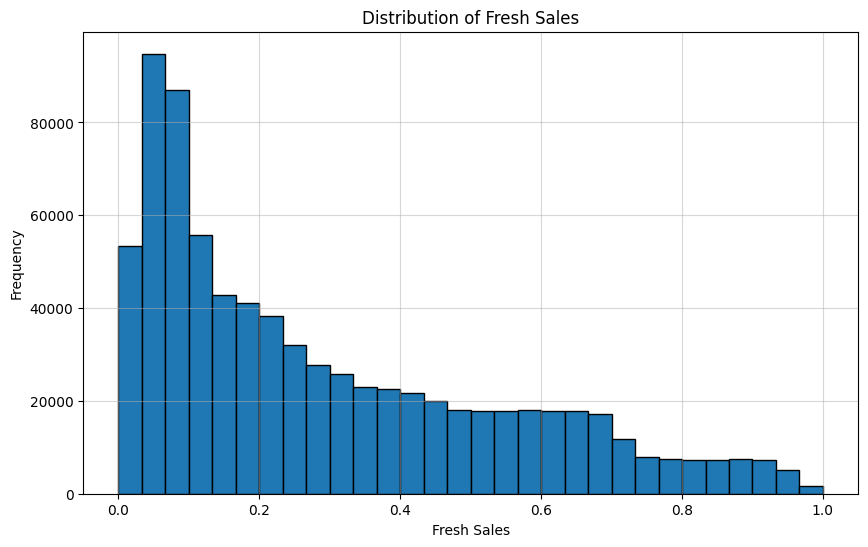

In [ ]:
# Create histogram
plt.figure(figsize=(10, 6))  # Adjust figure size if needed
plt.hist(df['fresh_sales'], bins=30, edgecolor='black')

# Customize the plot
plt.title("Distribution of Fresh Sales")
plt.xlabel("Fresh Sales")
plt.ylabel("Frequency")
plt.grid(True, alpha=0.5)  # Add a grid for better readability

# Display the histogram
plt.show()

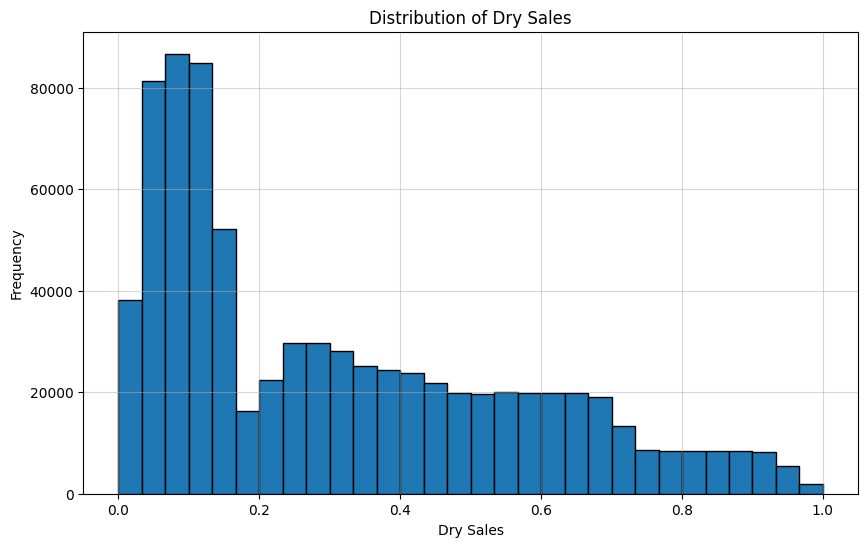

In [ ]:
# Create histogram
plt.figure(figsize=(10, 6))  # Adjust figure size if needed
plt.hist(df['dry_sales'], bins=30, edgecolor='black')

# Customize the plot
plt.title("Distribution of Dry Sales")
plt.xlabel("Dry Sales")
plt.ylabel("Frequency")
plt.grid(True, alpha=0.5)  # Add a grid for better readability

# Display the histogram
plt.show()

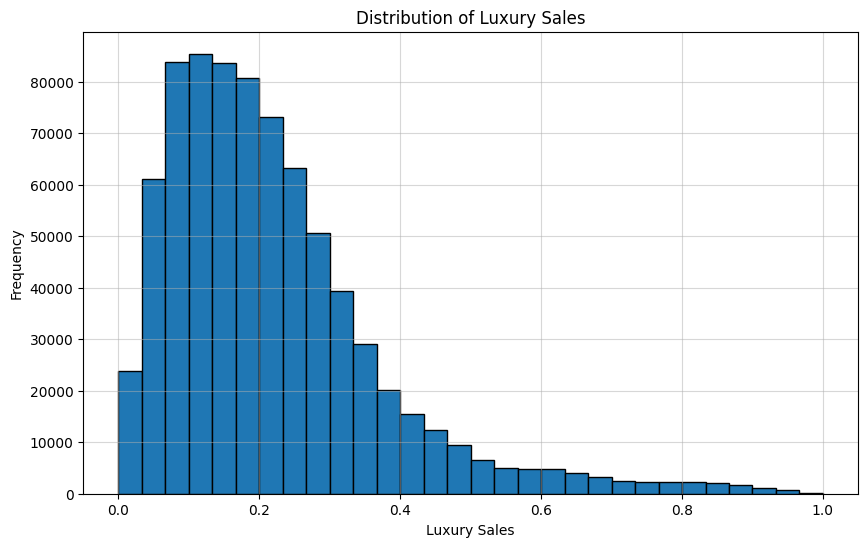

In [ ]:
# Create histogram
plt.figure(figsize=(10, 6))
plt.hist(df['luxury_sales'], bins=30, edgecolor='black')

# Customize the plot
plt.title("Distribution of Luxury Sales")
plt.xlabel("Luxury Sales")
plt.ylabel("Frequency")
plt.grid(True, alpha=0.5)
# Display the histogram
plt.show()

In [ ]:
#Box plots of dry sales
fig1 = px.box(df, y="dry_sales", title="Box Plot of Dry Sales")
fig1.show()

In [ ]:
#Box plots of luxury sales
fig2 = px.box(df, y="luxury_sales", title="Box Plot of Luxury Sales")
fig2.show()

In [ ]:
#Box plots of dry sales
fig1 = px.box(df, y="dry_sales", title="Box Plot of Dry Sales")
fig1.show()

In [ ]:
#Box plots of fresh sales
fig3 = px.box(df, y="fresh_sales", title="Box Plot of Fresh Sales")
fig3.show()

In [ ]:
# Calculate correlation matrix
corr_matrix = df[['luxury_sales', 'fresh_sales', 'dry_sales']].corr()

# Create heatmap
plt.figure(figsize=(8, 6))  # Adjust figure size if needed
sns.heatmap(corr_matrix, annot=True, cmap='viridis', fmt=".2f")
plt.title("Correlation Heatmap")
plt.show()

In [ ]:
#Sales by City
city_sales = df.groupby('outlet_city')[['luxury_sales', 'fresh_sales', 'dry_sales']].sum().reset_index()
fig = px.bar(city_sales, x='outlet_city', y=['luxury_sales', 'fresh_sales', 'dry_sales'],
             title="Sales by City", barmode='group')
fig.show()

In [ ]:
#Luxury Sales vs Dry Sales
fig = px.scatter(df, x="luxury_sales", y="dry_sales", color="cluster_catgeory",
                 opacity=0.7, title="Luxury Sales vs. Dry Sales (Colored by Cluster)")
fig.update_layout(xaxis_title="Luxury Sales", yaxis_title="Dry Sales", legend_title_text="Cluster")
fig.show()